# Chocolate Milkshake BIDS processing

The Chocolate Milkshake dataset has 4 waves (sessions) and around 130~ each   
The tasks are: 

In [1]:
import glob, os
import pandas as pd
import subprocess as sp

## View DICOM IDs Available

In [2]:
dicom_folder='/projects/niblab/data/eric_data/dicoms' # dicom folder 
w1_dicoms=glob.glob(os.path.join(dicom_folder, "wave1", "dicoms", "*"))
w2_dicoms=glob.glob(os.path.join(dicom_folder, "wave2", "Dicoms", "*/*"))
w3_dicoms=glob.glob(os.path.join(dicom_folder, "wave3", "Dicoms", "*/*"))
w4_dicoms=glob.glob(os.path.join(dicom_folder, "wave4", "Dicoms", "*/*"))


In [3]:
print("[INFO] wave1 has %s dicoms folders "%len(w1_dicoms))
print("[INFO] wave2 has %s dicoms folders "%len(w2_dicoms))
print("[INFO] wave3 has %s dicoms folders "%len(w3_dicoms))
print("[INFO] wave4 has %s dicoms folders "%len(w4_dicoms))

[INFO] wave1 has 151 dicoms folders 
[INFO] wave2 has 125 dicoms folders 
[INFO] wave3 has 112 dicoms folders 
[INFO] wave4 has 99 dicoms folders 


In [4]:
print('[INFO] wave1 dicom IDS founds: \n', [x.split("/")[-1] for x in w1_dicoms])

[INFO] wave1 dicom IDS founds: 
 ['evs', '002', '004', '005', '006', '007', '008', '009', '010', '011', '012', '013', '014', '015', '017', '018', '019', '020', '021', '022', '026', '027', '028', '029', '030', '032', '033', '034', '035', '037', '038', '039', '040', '041', '042', '043', '044', '045', '046', '047', '048', '049', '051', '052', '053', '054', '055', '056', '057', '058', '059', '060', '061', '062', '063', '064', '065', '066', '068', '069', '071', '072', '073', '075', '076', '077', '078', '079', '080', '081', '082', '083', '084', '085', '087', '088', '089', '090', '130', '092', '093', '094', '095', '096', '097', '098', '099', '100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '122', '123', '124', '126', '127', '128', '132', '138', '137', '142', '145', 'cs064', '147', '150', '151', '152', '153', '154', '125', '131', '133', 'excluded', 'raw_dicoms', '001', '136', '139', '143', '144', 

In [5]:
print('[INFO] wave2 dicom IDS founds: \n', [x.split("/")[-1] for x in w2_dicoms])

[INFO] wave2 dicom IDS founds: 
 ['002', '004', '004_2', '005', '006', '007', '008', '009', '010', '011', '012', '013', '014', '017', '018', '019', '021', '022', '027', '028', '030', '032', '033', '034', '035', '037', '039', '040', '041', '042', '043', '044', '045', '046', '047', '048', '049', '051', '052', '053', '054', '055', '056', '057', '058', '059', '060', '061', '062', '063', '064', '065', '066', '068', '069', '071', '072', '073', '075', '076', '077', '078', '079', '081', '082', '083', '084', '085', '088', '089', '090', '091', '092', '093', '094', '095', '096', '097', '098', '099', '101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '112', '113', '114', '115', '116', '117', '118', '118_2', '119', '120', '121', '122', '123', '125', '126', '127', '128', '130', '131', '132', '133', '136', '137', '138', '142', '143', '144', '145', '150', '151', '152', '153', '154', 'cs45', '001']


In [6]:
print('[INFO] wave3 dicom IDS founds: \n', [x.split("/")[-1] for x in w3_dicoms])

[INFO] wave3 dicom IDS founds: 
 ['002', '004', '005', '006', '008', '009', '011', '012', '013', '014', '017', '018', '022', '028', '030', '032', '033', '034', '037', '040', '041', '042', '043', '044', '045', '046', '047', '048', '049', '051', '052', '053', '054', '055', '056', '057', '058', '060', '061', '062', '063', '064', '065', '066', '068', '069', '071', '072', '073', '075', '076', '077', '078', '079', '081', '082', '083', '084', '085', '088', '089', '090', '091', '092', '093', '094', '095', '096', '097', '098', '099', '101', '102', '103', '104', '105', '106', '107', '109', '110', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '126', '127', '128', '130', '131', '132', '133', '136', '137', '138', '142', '143', '144', '145', '150', '151', '152', '153', '154', '001']


In [7]:
print('[INFO] wave4 dicom IDS founds: \n', [x.split("/")[-1] for x in w4_dicoms])

[INFO] wave4 dicom IDS founds: 
 ['002', '004', '005', '006', '008', '029', '011', '012', '013', '014', '017', '018', '022', '028', '030', '059', '032', '033', '034', '037', '040', '041', '042', '043', '044', '045', '046', '047', '048', '049', '051', '052', '053', '054', '055', '056', '057', '058', '060', '061', '062', '063', '064', '065', '066', '068', '071', '072', '075', '076', '077', '078', '079', '081', '082', '083', '084', '085', '088', '089', '090', '091', '092', '093', '094', '095', '096', '097', '098', '099', '101', '102', '103', '104', '105', '106', '107', '109', '110', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '126', '127', '128', '130', '131', '132', '154', '007', '001']


## Submit batch jobs

In [31]:
# BIDS helper function
"""
# BIDS Batch Method
"""
def run_bids_batch(job_file, sess, x,y,z, submit_job=False):
    # submit batch job
    if submit_job==True: 
        print(' '.join(['sbatch', '--array={}-{}%{}'.format(x, y, z), job_file, sess]))
        sp.run(['sbatch', '--array={}-{}%{}'.format(x, y, z), job_file, sess])
        print('[INFO] submitted bids job.')
        

In [117]:
# Set Parameters
bids_job_file=os.path.join("/projects/niblab/experiments/chocolate_milkshake/code/bids.job")


for x in ['sub-062', 'sub-072', 'sub-093', 'sub-094', 'sub-095',
          'sub-096', 'sub-097', 'sub-098', 'sub-099', 'sub-106',
          'sub-120', 'sub-128', 'sub-130', 'sub-131', 'sub-132', 'sub-154']:
    num_id=x.split("-")[1].lstrip('0')
    start_id=num_id
    finish_id=num_id
    z=1 # how many jobs to run
    sess='4'
    submit_job= True
    #print(num_id)
    # set to True when you want to run the file 

    # single sub
    run_bids_batch(bids_job_file,  sess,start_id, finish_id, z, submit_job)



sbatch --array=62-62%1 /projects/niblab/experiments/chocolate_milkshake/code/bids.job 4
[INFO] submitted bids job.
sbatch --array=72-72%1 /projects/niblab/experiments/chocolate_milkshake/code/bids.job 4
[INFO] submitted bids job.
sbatch --array=93-93%1 /projects/niblab/experiments/chocolate_milkshake/code/bids.job 4
[INFO] submitted bids job.
sbatch --array=94-94%1 /projects/niblab/experiments/chocolate_milkshake/code/bids.job 4
[INFO] submitted bids job.
sbatch --array=95-95%1 /projects/niblab/experiments/chocolate_milkshake/code/bids.job 4
[INFO] submitted bids job.
sbatch --array=96-96%1 /projects/niblab/experiments/chocolate_milkshake/code/bids.job 4
[INFO] submitted bids job.
sbatch --array=97-97%1 /projects/niblab/experiments/chocolate_milkshake/code/bids.job 4
[INFO] submitted bids job.
sbatch --array=98-98%1 /projects/niblab/experiments/chocolate_milkshake/code/bids.job 4
[INFO] submitted bids job.
sbatch --array=99-99%1 /projects/niblab/experiments/chocolate_milkshake/code/bid

['sub-014',
 'sub-062',
 'sub-084',
 'sub-088',
 'sub-089',
 'sub-090',
 'sub-092',
 'sub-093',
 'sub-094',
 'sub-095',
 'sub-096',
 'sub-097',
 'sub-098',
 'sub-099',
 'sub-112',
 'sub-120',
 'sub-130',
 'sub-131',
 'sub-132',
 'sub-133',
 'sub-136',
 'sub-137',
 'sub-138',
 'sub-145',
 'sub-150',
 'sub-151',
 'sub-152',
 'sub-153',
 'sub-154']

---

## Quality Check

In [10]:
def plot_epi(func):
    
    
    # Compute the voxel_wise mean of functional images across time.
    # Basically reducing the functional image from 4D to 3D
    mean_img = image.mean_img(func)
    
    sub=func.split("/")[-1].split("_")[0]
    ses=func.split("/")[-1].split("_")[1]
    task=func.split("/")[-1].split("_")[2]
    
    
    title="%s %s %s bold file "%(sub, ses, task)
    
    # Visualizing mean image (3D)
    plotting.plot_epi(mean_img, title=title)
    plt.show()


In [28]:
from nilearn import image

from nilearn import plotting

import matplotlib.pyplot as plt


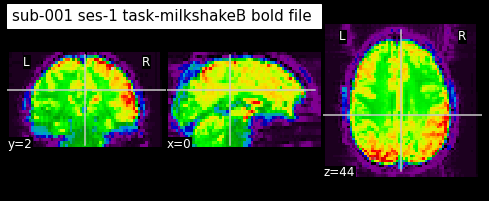

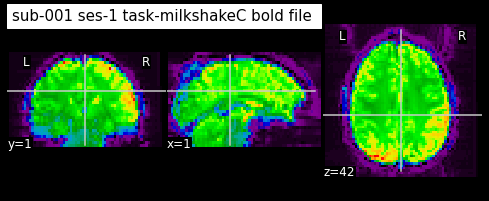

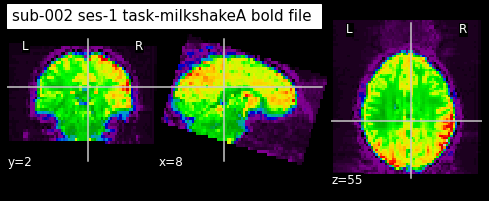

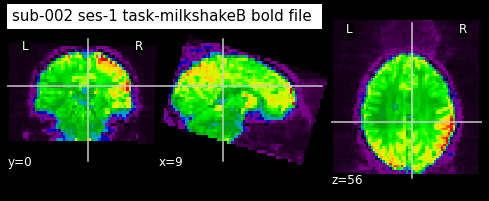

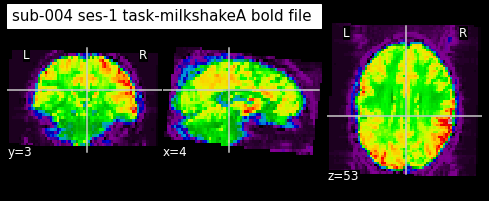

...

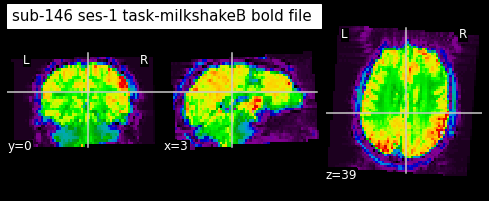

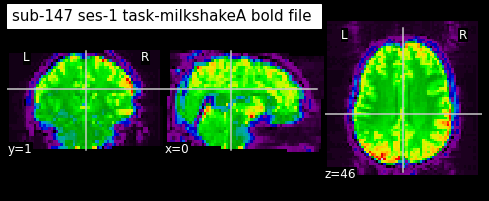

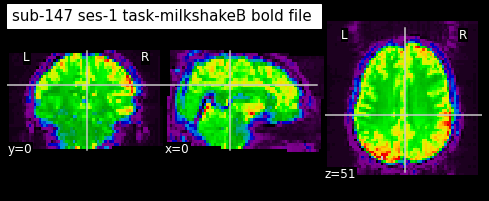

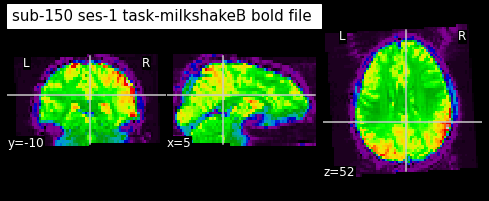

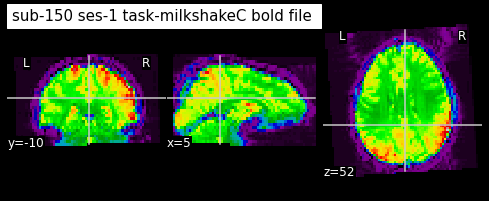

In [30]:
funcs=glob.glob('/projects/niblab/experiments/chocolate_milkshake/data/in_progress/bids/sub-*/ses-1/func/sub-*_ses-1_task-milkshake*_bold.nii.gz')
funcs.sort()
for func in funcs:
    plot_epi(func=func)

### Write Volume Report

For Chocolate Milkshake data we expect the following volumes for each image:  
milkshake tasks: 445  
imagine tasks: 475  


In [82]:
"""
# Build BIDS Report 

"""
def build_bids_report(write_files=False, sessions=['ses-1', 'ses-2', 'ses-3', 'ses-4']):
    
    
    print('[INFO] bids data folder: %s'%bids_data_path)
    dataframes=[]
    logfile=open('/projects/niblab/experiments/chocolate_milkshake/data/reports/bad_volumes.log', 'a+')
    
    # loop through sessions
    for session in sessions:
        #print("\n[INFO] %s"%session)

        data_dict={} #initialize data dictionary for session

        # loop through subject set by subject
        for i in range(1,155):
            subject="sub-%s"%f'{i:03}'
            bids_folder=os.path.join(bids_data_path, subject,
                                    session)

           
            if subject not in data_dict:
                data_dict[subject] = {}

                
            #--
            # get anat file
            
            anat_imgs =glob.glob(os.path.join(bids_folder, "anat",
                   '%s_%s_T1w.nii.gz'%(subject, session)))

            data_dict[subject]["anat_file_ct"]=len(anat_imgs)

            # get fmap files
            
            fmap_magn_imgs =glob.glob(os.path.join(bids_folder, "fmap",
                   '%s_%s_magnitude[0-9].nii.gz'%(subject, session)))
            
            data_dict[subject]["fmap_magnitude_file_ct"]=len(fmap_magn_imgs)

            fmap_phase_imgs =glob.glob(os.path.join(bids_folder, "fmap",
                   '%s_%s_phasediff.nii.gz'%(subject, session)))
            
            data_dict[subject]["fmap_phasediff_file_ct"]=len(fmap_phase_imgs)

            
            # ---
            
            # get functional files and check their volume and plot images

            func_files=glob.glob(os.path.join(
                    bids_folder, "func/*.nii.gz" ))

            # --initialize variables --
            milk_ct=0
            imagine_ct=0
            milk_ids=[]
            for func_file in func_files:
                task=func_file.split("/")[-1].split("_")[2]
                
                vol = sp.check_output(["fslnvols", func_file])
                vol=str(vol,'utf-8').strip("\n")

                if "imagine" in task:
                    imagine_ct+=1
                    var_name="imagine_vol"
                    data_dict[subject][var_name]=vol
                    if vol != '475':
                        logfile.write("bad volume for %s"%func_file)
                    
                    
                elif "milkshake" in task and "physio" not in func_file:
                    milk_id=task.split("-")[1][9]
                    milk_ids.append(milk_id)
                    milk_ct+=1
                    run=func_file.split("/")[-1].split("_")[3]
                    var_name="milkshake%s_vol"%(milk_ct)
                    data_dict[subject][var_name]=vol
                    
                    if vol != '445':
                        logfile.write("bad volume for %s"%func_file)

            data_dict[subject]["milkshake_file_ct"]=milk_ct
            data_dict[subject]["imagine_file_ct"]=imagine_ct
            data_dict[subject]["milkshake_ids"]=milk_ids
            
        dataframe=pd.DataFrame(data_dict).T
        dataframes.append(dataframe)
    
    print('[INFO] report building complete.')
    return dataframes;



In [83]:
"""
# BIDS Variables
"""

bids_data_path=os.path.join("/projects/niblab/experiments/chocolate_milkshake/data/bids")
report_folder_path=os.path.join('/projects/niblab/experiments/chocolate_milkshake/data/reports')
bids_folders=glob.glob(os.path.join(bids_data_path, "sub-*/ses-*"))
bids_ses1=[x for x in bids_folders if 'ses-1' in x]
bids_ses2=[x for x in bids_folders if 'ses-2' in x]
bids_ses3=[x for x in bids_folders if 'ses-3' in x]
bids_ses4=[x for x in bids_folders if 'ses-4' in x]

In [118]:
# build data report 
# -- if write_files=True, it will write out the report to an excel file
dataframes_orig=build_bids_report(write_files=False)

[INFO] bids data folder: /projects/niblab/experiments/chocolate_milkshake/data/bids
[INFO] report building complete.


### Checking session-1

In [119]:
s1_df=dataframes_orig[0]
s1_df.index.name = "patID"


In [120]:
s1_df.columns.values

array(['anat_file_ct', 'fmap_magnitude_file_ct', 'fmap_phasediff_file_ct',
       'milkshake1_vol', 'milkshake2_vol', 'imagine_vol',
       'milkshake_file_ct', 'imagine_file_ct', 'milkshake_ids'],
      dtype=object)

In [121]:
s1_df[['anat_file_ct', 'fmap_magnitude_file_ct', 'fmap_phasediff_file_ct',
       'milkshake1_vol', 'milkshake2_vol', 'imagine_vol',
       'milkshake_file_ct', 'imagine_file_ct']].style.highlight_null('red')

,anat_file_ct,fmap_magnitude_file_ct,fmap_phasediff_file_ct,milkshake1_vol,milkshake2_vol,imagine_vol,milkshake_file_ct,imagine_file_ct
patID,,,,,,,,
sub-001,1,2,1,445,445,475,2,1
sub-002,1,2,1,415,443,475,2,1
sub-003,0,0,0,nan,nan,nan,0,0
sub-004,1,0,0,445,445,475,2,1
sub-005,1,2,1,445,445,475,2,1
sub-006,1,2,1,443,443,475,2,1
sub-007,0,0,0,nan,nan,nan,0,0
sub-008,1,2,1,442,415,475,2,2
sub-009,1,2,1,445,445,475,2,1


In [122]:
s1_df[s1_df.isna().any(axis=1)]

,anat_file_ct,fmap_magnitude_file_ct,fmap_phasediff_file_ct,milkshake1_vol,milkshake2_vol,imagine_vol,milkshake_file_ct,imagine_file_ct,milkshake_ids
patID,,,,,,,,,
sub-003,0,0,0,NaN,NaN,NaN,0,0,[]
sub-007,0,0,0,NaN,NaN,NaN,0,0,[]
sub-016,0,0,0,NaN,NaN,NaN,0,0,[]
sub-023,0,0,0,NaN,NaN,NaN,0,0,[]
sub-024,0,0,0,NaN,NaN,NaN,0,0,[]
sub-025,0,0,0,NaN,NaN,NaN,0,0,[]
sub-031,0,0,0,NaN,NaN,NaN,0,0,[]
sub-032,1,0,0,NaN,NaN,NaN,0,0,[]
sub-036,0,0,0,NaN,NaN,NaN,0,0,[]


In [123]:
s1_df[s1_df.isna().any(axis=1)].index.values

array(['sub-003', 'sub-007', 'sub-016', 'sub-023', 'sub-024', 'sub-025',
       'sub-031', 'sub-032', 'sub-036', 'sub-050', 'sub-067', 'sub-070',
       'sub-074', 'sub-086', 'sub-091', 'sub-121', 'sub-129', 'sub-134',
       'sub-135', 'sub-140', 'sub-141', 'sub-148', 'sub-149'],
      dtype=object)

In [124]:
s1_df[s1_df['milkshake_file_ct'] > 0].index.values

array(['sub-001', 'sub-002', 'sub-004', 'sub-005', 'sub-006', 'sub-008',
       'sub-009', 'sub-010', 'sub-011', 'sub-012', 'sub-013', 'sub-014',
       'sub-015', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-021',
       'sub-022', 'sub-026', 'sub-027', 'sub-028', 'sub-029', 'sub-030',
       'sub-033', 'sub-034', 'sub-035', 'sub-037', 'sub-038', 'sub-039',
       'sub-040', 'sub-041', 'sub-042', 'sub-043', 'sub-044', 'sub-045',
       'sub-046', 'sub-047', 'sub-048', 'sub-049', 'sub-051', 'sub-052',
       'sub-053', 'sub-054', 'sub-055', 'sub-056', 'sub-057', 'sub-058',
       'sub-059', 'sub-060', 'sub-061', 'sub-062', 'sub-063', 'sub-064',
       'sub-065', 'sub-066', 'sub-068', 'sub-069', 'sub-071', 'sub-072',
       'sub-073', 'sub-075', 'sub-076', 'sub-077', 'sub-078', 'sub-079',
       'sub-080', 'sub-081', 'sub-082', 'sub-083', 'sub-084', 'sub-085',
       'sub-087', 'sub-088', 'sub-089', 'sub-090', 'sub-092', 'sub-093',
       'sub-094', 'sub-095', 'sub-096', 'sub-097', 

In [125]:
len(s1_df[s1_df['milkshake_file_ct'] > 0].index.values)

131

In [126]:
removed=['sub-003', 'sub-016', 'sub-023', 'sub-024', 'sub-025', 'sub-031','sub-032',  'sub-036', 'sub-050',
        'sub-067','sub-070', 'sub-074', 'sub-086', 'sub-091', 'sub-121','sub-129', 'sub-134',
        'sub-135', 'sub-140', 'sub-141', 'sub-148', 'sub-149' ]


In [127]:
[x for x in list(s1_df[s1_df.isna().any(axis=1)].index.values) if x not in removed]

['sub-007']

In [128]:
len([x for x in list(s1_df[s1_df.isna().any(axis=1)].index.values) if x not in removed])

1

### Checking session-2

In [129]:
s2_df=dataframes_orig[1]
s2_df.index.name = "patID"


In [130]:
s2_df[s2_df['milkshake_file_ct'] > 0].index.values

array(['sub-001', 'sub-002', 'sub-004', 'sub-005', 'sub-006', 'sub-007',
       'sub-008', 'sub-009', 'sub-010', 'sub-011', 'sub-012', 'sub-013',
       'sub-014', 'sub-017', 'sub-018', 'sub-019', 'sub-021', 'sub-022',
       'sub-027', 'sub-028', 'sub-030', 'sub-032', 'sub-033', 'sub-034',
       'sub-035', 'sub-037', 'sub-039', 'sub-040', 'sub-041', 'sub-042',
       'sub-043', 'sub-044', 'sub-045', 'sub-046', 'sub-047', 'sub-048',
       'sub-049', 'sub-051', 'sub-052', 'sub-053', 'sub-054', 'sub-055',
       'sub-056', 'sub-057', 'sub-058', 'sub-059', 'sub-060', 'sub-061',
       'sub-063', 'sub-064', 'sub-065', 'sub-066', 'sub-068', 'sub-069',
       'sub-071', 'sub-072', 'sub-073', 'sub-075', 'sub-076', 'sub-077',
       'sub-078', 'sub-079', 'sub-081', 'sub-082', 'sub-083', 'sub-084',
       'sub-085', 'sub-088', 'sub-089', 'sub-090', 'sub-091', 'sub-092',
       'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098',
       'sub-099', 'sub-101', 'sub-102', 'sub-103', 

In [131]:
len(s2_df[s2_df['milkshake_file_ct'] > 0].index.values)

119

In [132]:
removed_s2=['sub-015', 'sub-020', 'sub-026', 'sub-029',  'sub-036',  'sub-038',  'sub-080', 'sub-087',
             'sub-100',  'sub-111',  'sub-124','sub-146','sub-147']


In [133]:
[x for x in list(s2_df[s2_df.isna().any(axis=1)].index.values) if x not in removed and x not in removed_s2]

['sub-062', 'sub-064', 'sub-118', 'sub-139']

In [134]:
s2_df[['anat_file_ct', 'fmap_magnitude_file_ct', 'fmap_phasediff_file_ct',
       'milkshake1_vol', 'milkshake2_vol', 'imagine_vol',
       'milkshake_file_ct', 'imagine_file_ct']].style.highlight_null('red')

,anat_file_ct,fmap_magnitude_file_ct,fmap_phasediff_file_ct,milkshake1_vol,milkshake2_vol,imagine_vol,milkshake_file_ct,imagine_file_ct
patID,,,,,,,,
sub-001,1,2,1,445,445,475,2,1
sub-002,1,2,1,445,445,475,2,1
sub-003,0,0,0,nan,nan,nan,0,0
sub-004,1,2,1,445,445,475,2,1
sub-005,1,2,1,445,445,475,2,1
sub-006,1,2,1,445,445,475,2,1
sub-007,1,2,1,445,445,475,2,1
sub-008,1,2,1,445,445,475,2,1
sub-009,1,2,1,445,445,475,2,1


### Checking session-3

In [135]:
s3_df=dataframes_orig[2]
s3_df.index.name = "patID"


In [136]:
s3_df[s3_df['milkshake_file_ct'] > 0].index.values

array(['sub-001', 'sub-002', 'sub-004', 'sub-005', 'sub-006', 'sub-008',
       'sub-009', 'sub-011', 'sub-012', 'sub-013', 'sub-014', 'sub-017',
       'sub-018', 'sub-022', 'sub-028', 'sub-030', 'sub-032', 'sub-033',
       'sub-034', 'sub-037', 'sub-040', 'sub-041', 'sub-042', 'sub-043',
       'sub-044', 'sub-045', 'sub-046', 'sub-047', 'sub-048', 'sub-049',
       'sub-051', 'sub-052', 'sub-053', 'sub-054', 'sub-055', 'sub-056',
       'sub-057', 'sub-058', 'sub-060', 'sub-061', 'sub-063', 'sub-064',
       'sub-065', 'sub-066', 'sub-068', 'sub-069', 'sub-071', 'sub-072',
       'sub-073', 'sub-075', 'sub-076', 'sub-077', 'sub-078', 'sub-079',
       'sub-081', 'sub-082', 'sub-083', 'sub-084', 'sub-085', 'sub-088',
       'sub-089', 'sub-090', 'sub-092', 'sub-093', 'sub-094', 'sub-095',
       'sub-096', 'sub-097', 'sub-098', 'sub-099', 'sub-101', 'sub-102',
       'sub-103', 'sub-104', 'sub-105', 'sub-106', 'sub-107', 'sub-109',
       'sub-110', 'sub-112', 'sub-113', 'sub-114', 

In [137]:
len(s3_df[s3_df['milkshake_file_ct'] > 0].index.values)

109

In [138]:
removed_s3=['sub-007','sub-010','sub-019',  'sub-021', 'sub-027', 'sub-035', 'sub-039', 'sub-059', 'sub-108',
             'sub-125', 'sub-139']



In [139]:
[x for x in list(s3_df[s3_df.isna().any(axis=1)].index.values) if x not in removed and x not in removed_s2 and x not in removed_s3]

['sub-062', 'sub-112', 'sub-120']

In [140]:
s3_df[['anat_file_ct', 'fmap_magnitude_file_ct', 'fmap_phasediff_file_ct',
       'milkshake1_vol', 'milkshake2_vol', 'imagine_vol',
       'milkshake_file_ct', 'imagine_file_ct']].style.highlight_null('red')

,anat_file_ct,fmap_magnitude_file_ct,fmap_phasediff_file_ct,milkshake1_vol,milkshake2_vol,imagine_vol,milkshake_file_ct,imagine_file_ct
patID,,,,,,,,
sub-001,1,2,1,445,445,475,2,1
sub-002,1,2,1,445,445,475,2,1
sub-003,0,0,0,nan,nan,nan,0,0
sub-004,1,2,1,445,445,475,2,1
sub-005,1,2,1,445,445,475,2,1
sub-006,1,2,1,445,445,475,2,1
sub-007,0,0,0,nan,nan,nan,0,0
sub-008,1,2,1,445,445,475,2,1
sub-009,1,2,1,445,445,475,2,1


### Checking session-4

In [141]:
s4_df=dataframes_orig[3]
s4_df.index.name = "patID"

In [142]:
s4_df[s4_df['milkshake_file_ct'] > 0].index.values

array(['sub-001', 'sub-002', 'sub-004', 'sub-005', 'sub-006', 'sub-007',
       'sub-008', 'sub-011', 'sub-012', 'sub-013', 'sub-014', 'sub-017',
       'sub-018', 'sub-022', 'sub-028', 'sub-029', 'sub-030', 'sub-032',
       'sub-033', 'sub-034', 'sub-037', 'sub-040', 'sub-041', 'sub-042',
       'sub-043', 'sub-044', 'sub-045', 'sub-046', 'sub-047', 'sub-048',
       'sub-049', 'sub-051', 'sub-052', 'sub-053', 'sub-054', 'sub-055',
       'sub-056', 'sub-057', 'sub-058', 'sub-059', 'sub-060', 'sub-061',
       'sub-063', 'sub-064', 'sub-065', 'sub-066', 'sub-068', 'sub-071',
       'sub-072', 'sub-075', 'sub-076', 'sub-077', 'sub-078', 'sub-079',
       'sub-081', 'sub-082', 'sub-083', 'sub-084', 'sub-085', 'sub-088',
       'sub-089', 'sub-090', 'sub-092', 'sub-093', 'sub-094', 'sub-095',
       'sub-096', 'sub-097', 'sub-098', 'sub-099', 'sub-101', 'sub-102',
       'sub-103', 'sub-104', 'sub-105', 'sub-106', 'sub-107', 'sub-109',
       'sub-110', 'sub-113', 'sub-114', 'sub-115', 

In [143]:
len(s4_df[s4_df['milkshake_file_ct'] > 0].index.values)

96

In [144]:
removed_s4=['sub-009', 'sub-069',  'sub-073', 'sub-112',  'sub-133', 'sub-136',  'sub-137',
 'sub-138', 'sub-142', 'sub-143', 'sub-144', 'sub-145', 'sub-150', 'sub-151', 'sub-152', 'sub-153']

In [145]:
[x for x in list(s4_df[s4_df.isna().any(axis=1)].index.values) if x not in removed and x not in removed_s2 and x not in removed_s3 and x not in removed_s4]

['sub-062', 'sub-120']

In [146]:
s4_df[['anat_file_ct', 'fmap_magnitude_file_ct', 'fmap_phasediff_file_ct',
       'milkshake1_vol', 'milkshake2_vol', 'imagine_vol',
       'milkshake_file_ct', 'imagine_file_ct']].style.highlight_null('red')

,anat_file_ct,fmap_magnitude_file_ct,fmap_phasediff_file_ct,milkshake1_vol,milkshake2_vol,imagine_vol,milkshake_file_ct,imagine_file_ct
patID,,,,,,,,
sub-001,1,2,1,445,445,475,2,1
sub-002,1,2,1,445,445,475,2,1
sub-003,0,0,0,nan,nan,nan,0,0
sub-004,1,2,1,445,445,475,2,1
sub-005,1,2,1,445,445,475,2,1
sub-006,1,2,1,445,445,475,2,1
sub-007,1,2,1,445,5,nan,2,0
sub-008,1,2,1,445,445,475,2,1
sub-009,0,0,0,nan,nan,nan,0,0


---